In [ ]:
!pip uninstall torch -y # uninstall torch for paddle compatibility
!nvidia-smi # double check we are on a gpu runtime

Found existing installation: torch 2.8.0+cu126
Uninstalling torch-2.8.0+cu126:
  Successfully uninstalled torch-2.8.0+cu126
Wed Oct  8 05:58:11 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   34C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|               

In [ ]:
!python -m pip install paddlepaddle-gpu==3.0.0 -i https://www.paddlepaddle.org.cn/packages/stable/cu126/ # > /dev/null # this will take forever, needs to install paddle compatbility torch

Looking in indexes: https://www.paddlepaddle.org.cn/packages/stable/cu126/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 GB 513.8 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 571.0/571.0 MB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.8/156.8 MB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.4/201.4 MB 4.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-cusparselt-cu12
    Found existing installation: nvidia-cusparselt-cu12 0.7.1
    Uninstalling nvidia-cusparselt-cu12-0.7.1:
      Successfully uninstalled nvidia-cusparselt-cu12-0.7.1
  Attempting uninstall: opt_einsum
    Found existing installation: opt_einsum 3.4.0
    Uninstalling opt_einsum-3.4.0:
      Successfully uninstalled opt_einsum-3.4.0
  Attempting uninstall: nvidia-nccl-cu12
    Found existing installation: nvidia-nccl-cu12 2.27.3
    Uninstalling nvidia-nccl-cu12-2.27.3

In [ ]:
!python -m pip install "paddleocr[all]" > /dev/null
!pip install pymupdf > /dev/null
!pip install bbox-align > /dev/null

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
timm 1.0.20 requires torch, which is not installed.
fastai 2.8.4 requires torch<2.9,>=1.10, which is not installed.
accelerate 1.10.1 requires torch>=2.0.0, which is not installed.
peft 0.17.1 requires torch>=1.13.0, which is not installed.
torchdata 0.11.0 requires torch>=2, which is not installed.
google-colab 1.0.0 requires requests==2.32.4, but you have requests 2.32.5 which is incompatible.


In [ ]:
import paddle
import pymupdf
from PIL import Image
import os
from paddleocr import PaddleOCR
import json
from IPython.display import display
import re
import bbox_align
import cv2
import numpy as np
from scipy.ndimage import interpolation as inter

/usr/local/lib/python3.12/dist-packages/paddle/utils/cpp_extension/extension_utils.py:711: UserWarning: No ccache found. Please be aware that recompiling all source files may be required. You can download and install ccache from: https://github.com/ccache/ccache/blob/master/doc/INSTALL.md
  warnings.warn(warning_message)


In [ ]:
tos.makedirs("cropped", exist_ok=True)
os.makedirs("output", exist_ok=True)
os.makedirs("resources", exist_ok=True)
os.makedirs("preprocessed", exist_ok=True)
jrb_file_name = "jrb_5.pdf"
jrb_filepath = os.path.join("resources", jrb_file_name)
print(jrb_filepath)

start_page = 2 # Pages are 0 indexed (page 3 is actually page 2)
end_page = 8 # This will be used in a range, so make it 1 larger

resources/jrb_5.pdf


In [ ]:
ocr = PaddleOCR(
    use_doc_orientation_classify=False,
    use_doc_unwarping=False,
    use_textline_orientation=False) # text detection + text recognition

Creating model: ('PP-OCRv5_server_det', None)
Using official model (PP-OCRv5_server_det), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/PP-OCRv5_server_det`.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

inference.json: 0.00B [00:00, ?B/s]

.gitattributes: 0.00B [00:00, ?B/s]

README.md: 0.00B [00:00, ?B/s]

inference.yml:   0%|          | 0.00/903 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

inference.pdiparams:   0%|          | 0.00/87.9M [00:00<?, ?B/s]

Creating model: ('PP-OCRv5_server_rec', None)
Using official model (PP-OCRv5_server_rec), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/PP-OCRv5_server_rec`.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

inference.yml: 0.00B [00:00, ?B/s]

.gitattributes: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

README.md: 0.00B [00:00, ?B/s]

inference.json: 0.00B [00:00, ?B/s]

inference.pdiparams:   0%|          | 0.00/84.4M [00:00<?, ?B/s]

In [ ]:
def pdf_page_to_jpg(pdf_filepath, page_number):
  """ This function will convert a single page of a pdf to a jpg, and return the filepath to access """
  doc = pymupdf.open(pdf_filepath)
  page = doc.load_page(page_number)
  pix = page.get_pixmap(dpi=250) # Need to experiment with this
  cropped_filepath = os.path.join(f"cropped", f"cropped_im_{page_number}.png")
  pix.save(cropped_filepath)
  return cropped_filepath

def save_paddle_results(results, output_folder_name):
  """ This function will save the results of the paddle OCR to disk """
  for res in results:
    # res.print()
    res.save_to_img(output_folder_name)
    res.save_to_json(output_folder_name)

def scan_cropped_images(page_number, ocr, scan_image_filepath):
  output_folder_name = os.path.join("output", str(page_number))
  os.makedirs(output_folder_name, exist_ok=True)
  result = ocr.predict(scan_image_filepath)
  save_paddle_results(result, output_folder_name)
  return output_folder_name

In [ ]:
def correct_skew(image, delta=1, limit=5):
    def determine_score(arr, angle):
        data = inter.rotate(arr, angle, reshape=False, order=0)
        histogram = np.sum(data, axis=1, dtype=float)
        score = np.sum((histogram[1:] - histogram[:-1]) ** 2, dtype=float)
        return histogram, score

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    scores = []
    angles = np.arange(-limit, limit + delta, delta)
    for angle in angles:
        histogram, score = determine_score(thresh, angle)
        scores.append(score)

    best_angle = angles[scores.index(max(scores))]

    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, best_angle, 1.0)
    corrected = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, \
            borderMode=cv2.BORDER_REPLICATE)

    return best_angle, corrected

/tmp/ipython-input-763726387.py:3: DeprecationWarning: Please import `rotate` from the `scipy.ndimage` namespace; the `scipy.ndimage.interpolation` namespace is deprecated and will be removed in SciPy 2.0.0.
  data = inter.rotate(arr, angle, reshape=False, order=0)


Page 002 - saved, skew angle: 0.00


Connecting to https://paddle-model-ecology.bj.bcebos.com/paddlex/PaddleX3.0/fonts/simfang.ttf ...
[==================================================] 100.00%
Connecting to https://paddle-model-ecology.bj.bcebos.com/paddlex/PaddleX3.0/fonts/PingFang-SC-Regular.ttf ...
[==================================================] 100.00%


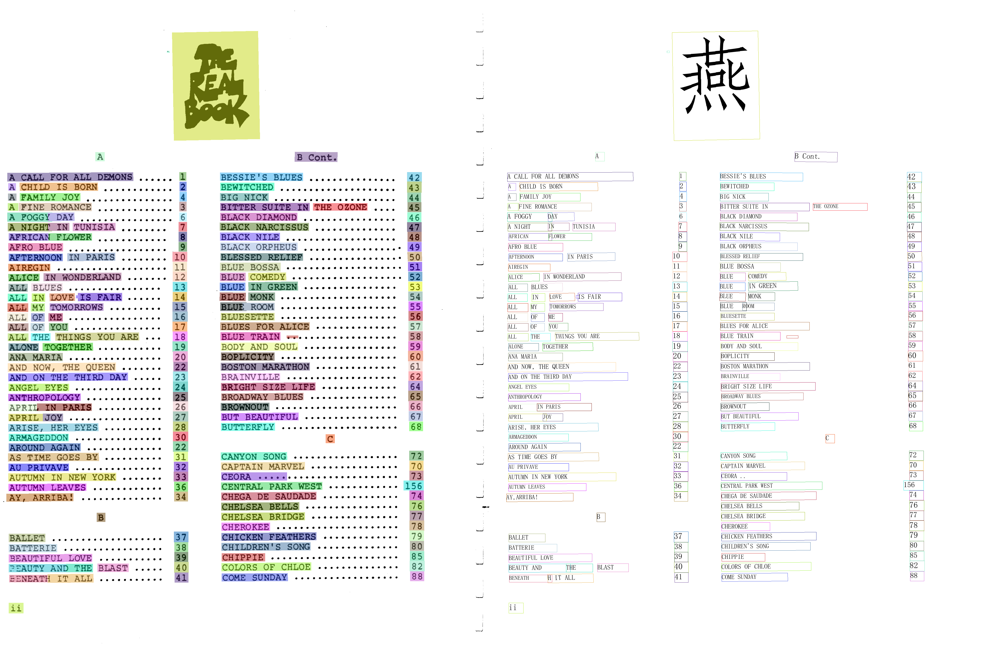

Page 003 - saved, skew angle: -1.00


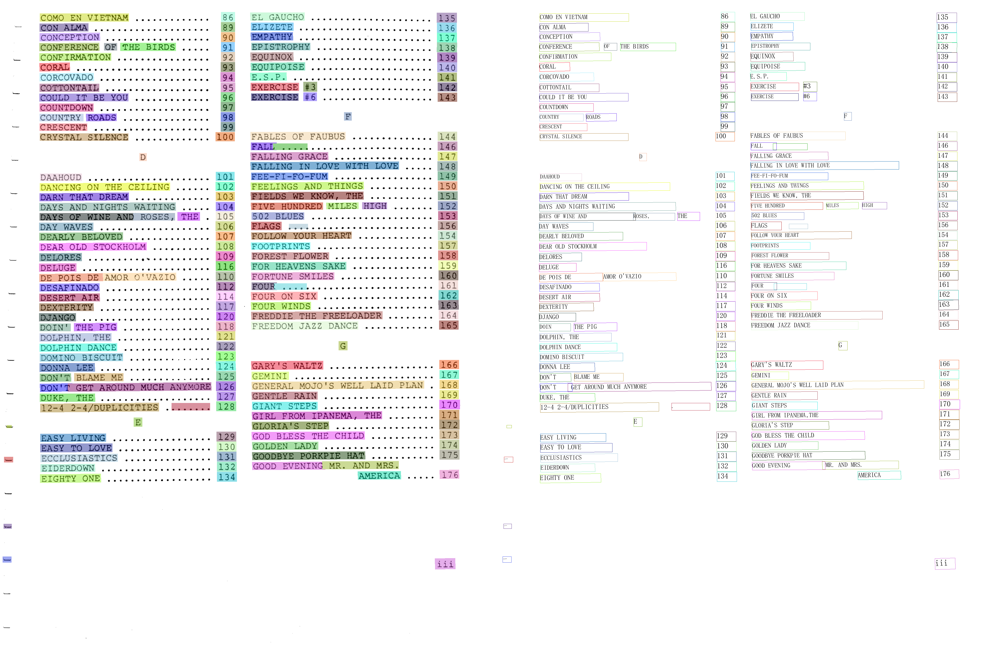

Page 004 - saved, skew angle: 0.00


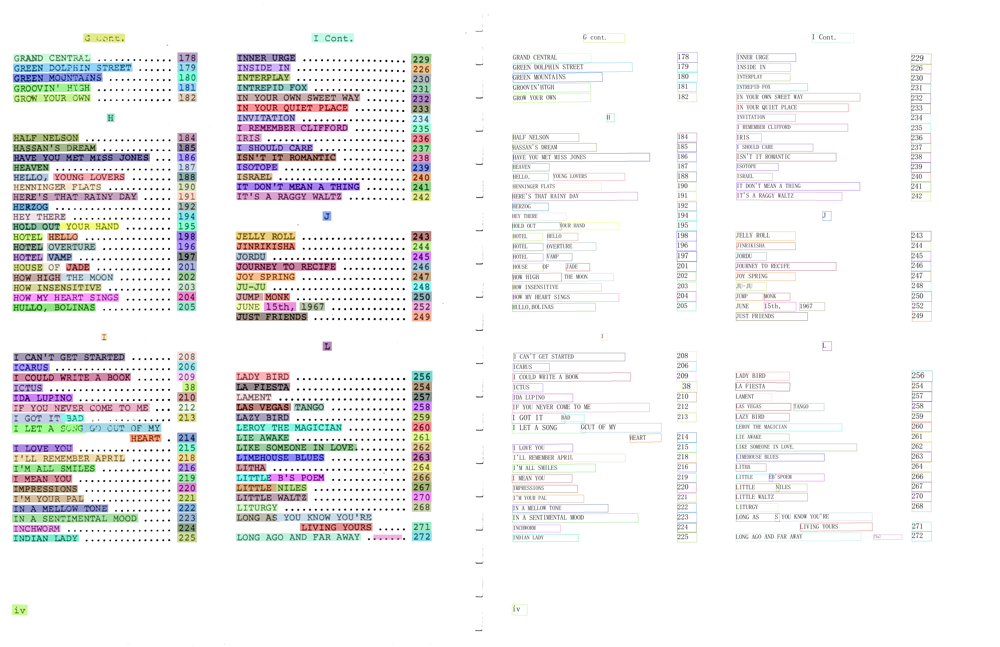

Page 005 - saved, skew angle: -1.00


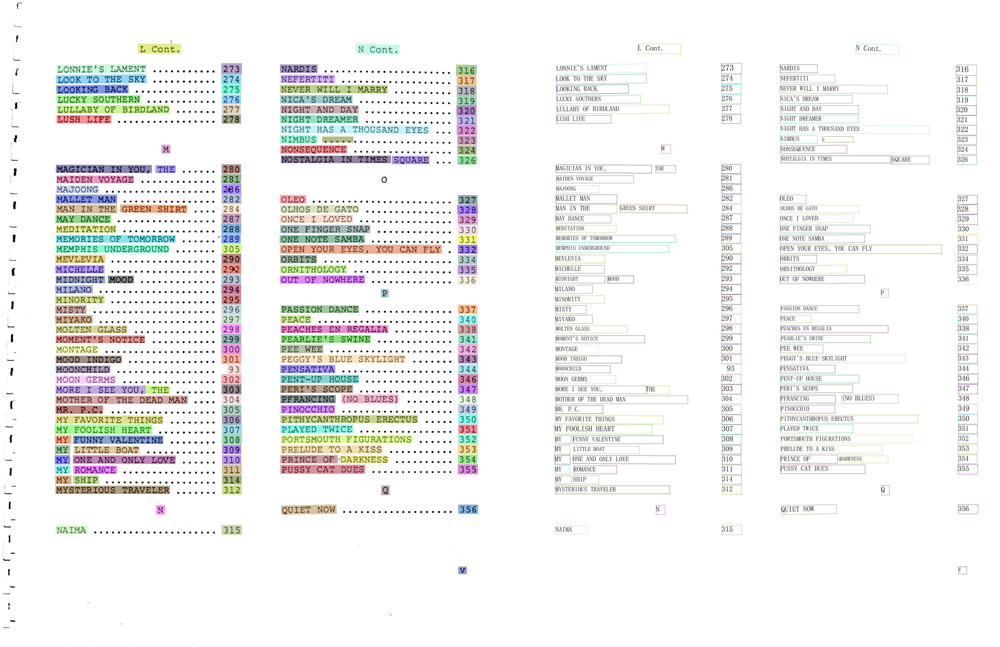

Page 006 - saved, skew angle: 0.00


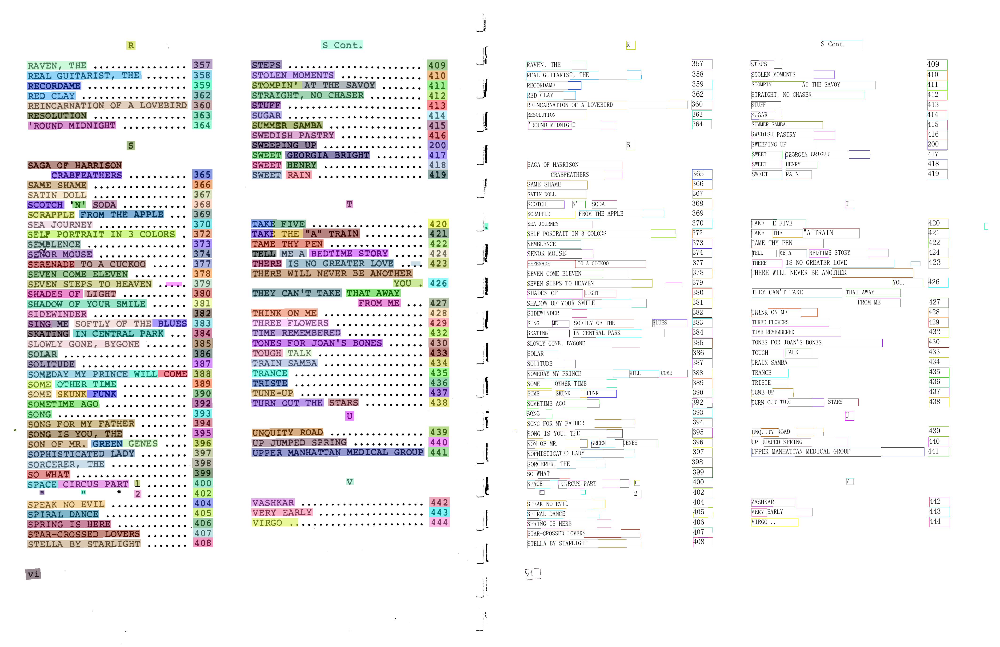

Page 007 - saved, skew angle: 0.00


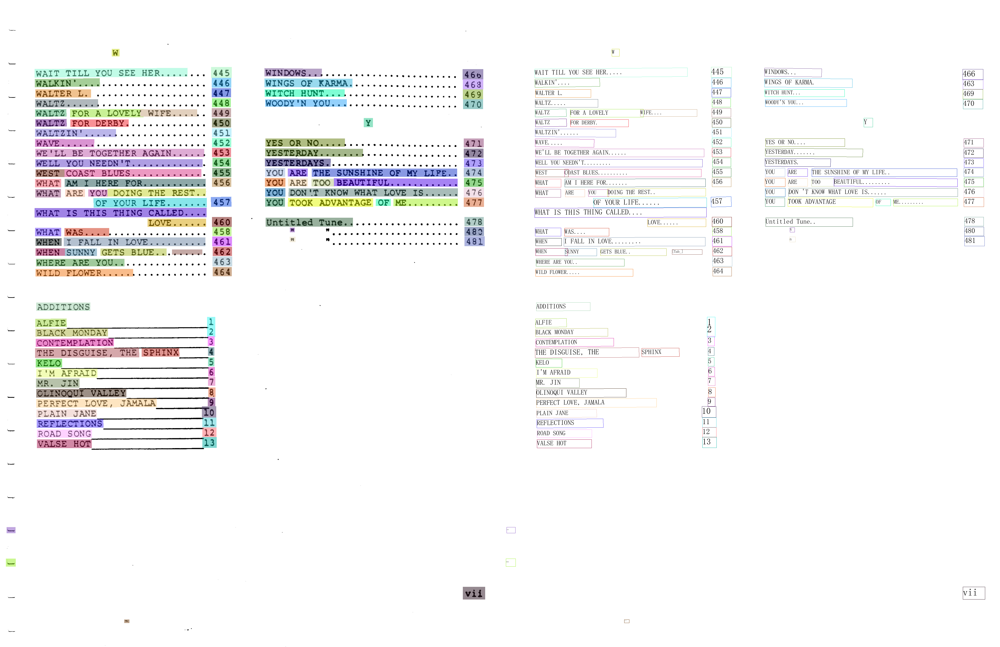

In [ ]:
for page_num in range(start_page, end_page):
  filename = pdf_page_to_jpg(jrb_filepath, page_num)
  image = cv2.imread(filename)
  angle, corrected = correct_skew(image)

  unskewed_filename = f"preprocessed/cropped_im_{page_num}.png"
  success = cv2.imwrite(unskewed_filename, corrected)

  print(f"Page {page_num:03d} - saved, skew angle: {angle:.2f}")
  output_folder_name = scan_cropped_images(page_num, ocr, unskewed_filename) # this runs the pipeline to scan page 2 of real book
  image = Image.open(f"output/{page_num}/cropped_im_{page_num}_ocr_res_img.png")
  display(image)



In [ ]:
def find_x_half(bounding_box, width, threshold): # threshold should be a float from 0-1
  x_center = (bounding_box[0][0]+bounding_box[1][0]) / 2
  if x_center/width < threshold:
    return 0
  return 1

def load_rec_data(page_number):
  output_folder_name = os.path.join("output", str(page_number), f"cropped_im_{page_number}_res.json")
  loaded_data = []
  with open(output_folder_name) as f:
    data = json.load(f)
    detected_boxes = len(data.get("rec_texts", []))
    for i in range(detected_boxes):
      words = data['rec_texts'][i]
      rec_scores = data['rec_scores'][i]
      vertices = data['rec_polys'][i]
      loaded_data.append({
          "words": words,
          "scores": rec_scores,
          "vertices": vertices
      })
  return loaded_data


def properly_aligned_text(line_rec):
  words = line_rec.split(" ")
  if len(words) <= 1:
    return 0
  number_of_nums = sum([word.strip().isdigit() for word in words])
  if words[-1].strip().isdigit() and number_of_nums == 1:
    return 1
  return 0


def seperate_ocr_data(loaded_data, width, threshold):
  vertices, words, rec_scores = [[], []], [[], []], [[], []]
  for data in loaded_data:
    # returns a 1 or 0 depending on if text is left or right of threshold
    page_side = find_x_half(data['vertices'], width, threshold)
    words[page_side].append(data['words'])
    rec_scores[page_side].append(data['scores'])
    vertices[page_side].append(data['vertices'])
  return vertices, words, rec_scores

def reconstruct_lines(lines, words):
  aligned_text = []
  for line in lines:
    sentence_list = [words[idx] for idx in line]
    aligned_text.append(' '.join(sentence_list))
  return aligned_text


def check_alignment_quality(aligned_text):
  line_well_aligned = [properly_aligned_text(line) for line in aligned_text]
  for i in range(len(aligned_text)):
    print(f"{aligned_text[i]} -> {line_well_aligned[i]}")
  return sum(line_well_aligned)/len(line_well_aligned)


In [ ]:
final_recognized_lines = {}
for page_number in range(start_page, end_page):
  image = Image.open(f"output/{page_number}/cropped_im_{page_number}_ocr_res_img.png")
  height, width = image.size
  boundaries = [ (0, 0), (width, 0), (width, height), (0, height) ]
  loaded_data = load_rec_data(page_number)

  best_quality = -1.0
  best_aligned_text = None # Will store the final [[side 0 lines], [side 1 lines]]
  best_threshold = None

  for threshold in np.arange(0.1, 0.91, 0.05):
    vertices, words, rec_scores = seperate_ocr_data(loaded_data, width, threshold)

    # only doing 1 side
    lines_side_0_indices = bbox_align.process(vertices[0], boundaries)
    aligned_text_side_0 = reconstruct_lines(lines_side_0_indices, words[0]) # list of line texts, space seperated

    line_well_aligned = [properly_aligned_text(line) for line in aligned_text_side_0]
    quality = check_alignment_quality(aligned_text_side_0)
    print(f"Threshold {threshold:.3f}: Alignment Quality = {quality:.2f}")

    if quality > best_quality:
      best_quality = quality
      best_threshold = threshold

      lines_side_1_indices = bbox_align.process(vertices[1], boundaries)
      aligned_text_side_1 = reconstruct_lines(lines_side_1_indices, words[1])
      best_aligned_text = [aligned_text_side_0, aligned_text_side_1]

  print(f"\n--- Final Result for Page {page_number} ---")
  print(f"Best Threshold Used: {best_threshold:.3f} (Quality: {best_quality:.2f})")
  print(best_aligned_text)
  print("\n- - - - - -\n")
  final_recognized_lines[page_number] = best_aligned_text

A CHILD IS BORN -> 0
A FAMILY JOY -> 0
A FINE ROMANCE -> 0
A FOGGY DAY -> 0
A NIGHT IN -> 0
AFRICAN -> 0
AFRO BLUE -> 0
AFTERNOON -> 0
AIREGIN -> 0
ALICE -> 0
ALL BLUES -> 0
ALL IN LOVE -> 0
ALL MY -> 0
ALL OF ME -> 0
ALL OF YOU -> 0
ALL THE -> 0
ALONE -> 0
ANA MARIA -> 0
AND NOW, THE QUEEN -> 0
ANGEL EYES -> 0
ANTHROPOLOGY -> 0
APRIL IN PARIS -> 0
APRIL JOY -> 0
ARISE, HER EYES -> 0
ARMAGEDDON -> 0
AROUND AGAIN -> 0
AS TIME GOES BY -> 0
AU PRIVAVE -> 0
AUTUMN IN NEW YORK -> 0
AUTUMN LEAVES -> 0
AY,ARRIBA! -> 0
BALLET -> 0
BATTERIE -> 0
BEAUTIFUL LOVE -> 0
BEAUTY AND -> 0
BENEATH -> 0
ii -> 0
Threshold 0.100: Alignment Quality = 0.00
A CALL FOR ALL DEMONS -> 0
A CHILD IS BORN -> 0
A FAMILY JOY -> 0
A FINE ROMANCE -> 0
A FOGGY DAY -> 0
A NIGHT IN TUNISIA -> 0
AFRICAN FLOWER -> 0
AFRO BLUE -> 0
AFTERNOON IN PARIS -> 0
AIREGIN -> 0
ALICE IN WONDERLAND -> 0
ALL BLUES -> 0
ALL IN LOVE  -> 0
ALL MY TOMORROWS -> 0
ALL OF ME -> 0
ALL OF YOU -> 0
ALL THE THINGS YOU ARE -> 0
ALONE TOGETHER -> 0


In [19]:
def is_section_header(rec_line):
  lowercase = rec_line.lower().strip()
  if len(lowercase) <= 3:
    return True
  if lowercase.endswith(' cont') or lowercase.endswith(' cont.'):
    return True
  return False

def song_line_to_dict(line):
  words = line.split(" ")
  if not words[-1].isdigit():
    return {'song_name': ' '.join(words).strip(), 'page_num': ''}
  return {'song_name': ' '.join(words[:-1]).strip(), 'page_num': words[-1]}

def clean_line_thoroughly(line):
  RE_CLEAN = re.compile(r'[<>:"/\\\\|?*.;]')
  line = RE_CLEAN.sub('', line)
  line = re.sub(r' +', ' ', line)
  return line


In [20]:
all_lines = []
for k, v in final_recognized_lines.items():
  for i in range(2):
    all_lines.extend(v[i])
song_lines = [line for line in all_lines if not is_section_header(line)]
cleaned_quality = check_alignment_quality(song_lines)
print(f"\nProportion of lines in ideal format: {cleaned_quality}")
print("(some lines are run on, 2 lines for one page number for long names)")
cleaned_song_lines = [clean_line_thoroughly(line) for line in song_lines]
song_dict_list = [song_line_to_dict(line) for line in cleaned_song_lines]

A CALL FOR ALL DEMONS 1 -> 1
A CHILD IS BORN 2 -> 1
A FAMILY JOY 4 -> 1
A FINE ROMANCE 3 -> 1
A FOGGY DAY 6 -> 1
A NIGHT IN TUNISIA 7 -> 1
AFRICAN FLOWER 8 -> 1
AFRO BLUE 9 -> 1
AFTERNOON IN PARIS 10 -> 1
AIREGIN 11 -> 1
ALICE IN WONDERLAND 12 -> 1
ALL BLUES 13 -> 1
ALL IN LOVE  IS FAIR 14 -> 1
ALL MY TOMORROWS 15 -> 1
ALL OF ME 16 -> 1
ALL OF YOU 17 -> 1
ALL THE THINGS YOU ARE 18 -> 1
ALONE TOGETHER 19 -> 1
ANA MARIA 20 -> 1
AND NOW, THE QUEEN 22 -> 1
AND ON THE THIRD DAY 23 -> 1
ANGEL EYES 24 -> 1
ANTHROPOLOGY 25 -> 1
APRIL IN PARIS 26 -> 1
APRIL JOY 27 -> 1
ARISE, HER EYES 28 -> 1
ARMAGEDDON 30 -> 1
AROUND AGAIN 22 -> 1
AS TIME GOES BY 31 -> 1
AU PRIVAVE 32 -> 1
AUTUMN IN NEW YORK 33 -> 1
AUTUMN LEAVES 36 -> 1
AY,ARRIBA! 34 -> 1
BALLET 37 -> 1
BATTERIE 38 -> 1
BEAUTIFUL LOVE 39 -> 1
BEAUTY AND THE BLAST 40 -> 1
BENEATH H IT ALL 41 -> 1
BESSIE'S BLUES 42 -> 1
BEWITCHED 43 -> 1
BIG NICK 44 -> 1
BITTER SUITE IN THE OZONE 45 -> 1
BLACK DIAMOND 46 -> 1
BLACK NARCISSUS 47 -> 1
BLACK NILE 

In [21]:
for line_dict in song_dict_list:
  print(f"{line_dict['page_num']}\t{line_dict['song_name']}")

1	A CALL FOR ALL DEMONS
2	A CHILD IS BORN
4	A FAMILY JOY
3	A FINE ROMANCE
6	A FOGGY DAY
7	A NIGHT IN TUNISIA
8	AFRICAN FLOWER
9	AFRO BLUE
10	AFTERNOON IN PARIS
11	AIREGIN
12	ALICE IN WONDERLAND
13	ALL BLUES
14	ALL IN LOVE IS FAIR
15	ALL MY TOMORROWS
16	ALL OF ME
17	ALL OF YOU
18	ALL THE THINGS YOU ARE
19	ALONE TOGETHER
20	ANA MARIA
22	AND NOW, THE QUEEN
23	AND ON THE THIRD DAY
24	ANGEL EYES
25	ANTHROPOLOGY
26	APRIL IN PARIS
27	APRIL JOY
28	ARISE, HER EYES
30	ARMAGEDDON
22	AROUND AGAIN
31	AS TIME GOES BY
32	AU PRIVAVE
33	AUTUMN IN NEW YORK
36	AUTUMN LEAVES
34	AY,ARRIBA!
37	BALLET
38	BATTERIE
39	BEAUTIFUL LOVE
40	BEAUTY AND THE BLAST
41	BENEATH H IT ALL
42	BESSIE'S BLUES
43	BEWITCHED
44	BIG NICK
45	BITTER SUITE IN THE OZONE
46	BLACK DIAMOND
47	BLACK NARCISSUS
48	BLACK NILE
49	BLACK ORPHEUS
50	BLESSED RELIEF
51	BLUE BOSSA
52	BLUE COMEDY
53	BLUE IN GREEN
54	BLUE MONK
55	BLUE ROOM
56	BLUESETTE
57	BLUES FOR ALICE
58	BLUE TRAIN
59	BODY AND SOUL
60	BOPLICITY
61	BOSTON MARATHON
62	BRAINVILLE
64